## [1] Set Up and Import Data

In [1]:
# import libraries
import copy
import scipy.io
import mat73
import numpy as np
from matplotlib import pyplot as plt 
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras import metrics
from tensorflow import keras
from sklearn.utils import shuffle
import collections
from sklearn import preprocessing
from sklearn.model_selection import train_test_split 
import pickle
from sklearn.preprocessing import MinMaxScaler

from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import GridSearchCV
import sklearn.metrics
from sklearn.metrics import accuracy_score

from sklearn.decomposition import PCA
from scipy.stats import kurtosis

import pandas as pd

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

tf.__version__ # we need 2.8.2

Num GPUs Available:  1


2023-04-10 22:52:33.833774: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-10 22:52:33.841894: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-04-10 22:52:33.842145: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


'2.8.2'

In [2]:
data_path = '/export03/data/Yuxin/pt_data/'
path = '/export03/data/Yuxin/pt_data/single_pt/'

In [3]:
POS_0090 = mat73.loadmat(data_path + 'pt0090/POS.mat')['POS']
NEG_0090 = mat73.loadmat(data_path + 'pt0090/NEG.mat')['NEG']

POS_0013 = mat73.loadmat(data_path + 'pt0013/POS.mat')['POS']
NEG_0013 = mat73.loadmat(data_path + 'pt0013/NEG.mat')['NEG']

POS_0025 = mat73.loadmat(data_path + 'pt0025/POS.mat')['POS']
NEG_0025 = mat73.loadmat(data_path + 'pt0025/NEG.mat')['NEG']

POS_0053 = mat73.loadmat(data_path + 'pt0053/POS.mat')['POS']
NEG_0053 = mat73.loadmat(data_path + 'pt0053/NEG.mat')['NEG']

POS_0049 = mat73.loadmat(data_path + 'pt0049/POS.mat')['POS']
NEG_0049 = mat73.loadmat(data_path + 'pt0049/NEG.mat')['NEG']

POS_0060 = mat73.loadmat(data_path + 'pt0060/POS.mat')['POS']
NEG_0060 = mat73.loadmat(data_path + 'pt0060/NEG.mat')['NEG']

## [2] Process and Scale Data

In [4]:
## By Raymundo Cassani, used with permission from: https://github.com/MuSAELab/amplitude-modulation-analysis-module/blob/master/am_analysis/am_analysis.py
def epoching(data, samples_epoch, samples_overlap = 0):
    try:
        data.shape[1]
    except IndexError:
        data = data[:, np.newaxis]
    n_samples, n_channels = data.shape
    half_epoch = np.ceil(samples_epoch / 2 )
    samples_shift = samples_epoch - samples_overlap
    n_epochs =  int(np.floor( (n_samples - samples_epoch) / float(samples_shift) ) + 1 )
    if n_epochs == 0:
        return np.array([]), data, np.array([])
    markers = np.asarray(range(0,n_epochs)) * samples_shift
    markers = markers.astype(int)
    epochs = np.zeros((samples_epoch, n_channels, n_epochs))
    ix_center = np.zeros((n_epochs,1))
    for i_epoch in range(0,n_epochs):
        epochs[:,:,i_epoch] = data[ markers[i_epoch] : markers[i_epoch] + samples_epoch ,:]
        ix_center[i_epoch] = markers[i_epoch] -1 + half_epoch
    if ( (markers[-1] + samples_epoch) < n_samples): 
        remainder = data[markers[-1] + samples_epoch : n_samples, :]
    else:
        remainder = np.asarray([])
    return epochs, remainder, ix_center.astype(int)

def scale_data(data):
  counter = 0
  return_copy = copy.deepcopy(data)
  for item in data:
    one_column = np.reshape(item, (-1, 1))
    scaler = MinMaxScaler()
    scaler.fit(one_column)
    one_column = scaler.transform(one_column)
    transformed = np.reshape(one_column, (data.shape[1], data.shape[2]))
    return_copy[counter] = transformed
    counter=counter+1
  return return_copy

def show_time_series(data, xlable, ylabel):
  cur = data 
  plt.plot(cur)
  plt.gca().invert_yaxis() #Invert to match the default reversed y-axis view in Brainstorm.
  plt.xlabel(xlable)
  plt.ylabel(ylabel)
  plt.show()

In [7]:
def process_raw_data(Data, MEG_start, MEG_end, EEG_start, EEG_end):
  print('================================================')
  nTotalChannel = Data.shape[0] # number of total channel
  eegChannelNum = EEG_end - EEG_start + 1
  megChannelNum = MEG_end - MEG_start + 1
  deep_copy = copy.deepcopy(Data)
  transposed  = np.transpose(deep_copy)
  # print('  -- the transposed data has size of: ' + str(transposed.shape) + ' --> should have [*, '+ str(nTotalChannel) +'] <--')

  EEG = transposed[:,EEG_start-1:EEG_end]
  MEG = transposed[:,MEG_start-1:MEG_end]

  EEG = epoching(EEG, 256, 0)[0]
  MEG = epoching(MEG, 256, 0)[0]

  EEG = EEG.transpose(2,0,1)
  MEG = MEG.transpose(2,0,1)
  print('  -- the EEG data has size of: ' + str(EEG.shape) + ' --> should have [epoch#, 256, '+ str(eegChannelNum) +'] <--')
  print('  -- the MEG data has size of: ' + str(MEG.shape) + ' --> should have [epoch#, 256, '+ str(megChannelNum) +'] <--')
  EEG = scale_data(EEG)
  MEG = scale_data(MEG)
  #return EEG, MEG, eegChannelNum, megChannelNum
  return EEG, MEG

In [60]:
# Facilitate NSCI 420

# POS_EEG, POS_MEG, eegChannelNum, megChannelNum = process_raw_data(POS_0013, 29, 300, 301, 321)
# NEG_EEG, NEG_MEG, eegChannelNum, megChannelNum = process_raw_data(NEG_0013, 29, 300, 301, 321)

# POS_EEG, POS_MEG, eegChannelNum, megChannelNum = process_raw_data(POS_0025, 29, 298, 299, 321)
# NEG_EEG, NEG_MEG, eegChannelNum, megChannelNum = process_raw_data(NEG_0025, 29, 298, 299, 321)

# POS_EEG, POS_MEG, eegChannelNum, megChannelNum = process_raw_data(POS_0049, 29, 299, 300, 355)
# NEG_EEG, NEG_MEG, eegChannelNum, megChannelNum = process_raw_data(NEG_0049, 29, 299, 300, 355)

# POS_EEG, POS_MEG, eegChannelNum, megChannelNum = process_raw_data(POS_0053, 29, 298, 299, 327)
# NEG_EEG, NEG_MEG, eegChannelNum, megChannelNum = process_raw_data(NEG_0053, 29, 298, 299, 327)

# POS_EEG, POS_MEG, eegChannelNum, megChannelNum = process_raw_data(POS_0060, 29, 299, 300, 355)
# NEG_EEG, NEG_MEG, eegChannelNum, megChannelNum = process_raw_data(NEG_0060, 29, 299, 300, 355)

POS_EEG, POS_MEG, eegChannelNum, megChannelNum = process_raw_data(POS_0090, 28, 301, 302, 357)
NEG_EEG, NEG_MEG, eegChannelNum, megChannelNum = process_raw_data(NEG_0090, 28, 301, 302, 357)

  -- the EEG data has size of: (1733, 256, 56) --> should have [epoch#, 256, 56] <--
  -- the MEG data has size of: (1733, 256, 274) --> should have [epoch#, 256, 274] <--
  -- the EEG data has size of: (1768, 256, 56) --> should have [epoch#, 256, 56] <--
  -- the MEG data has size of: (1768, 256, 274) --> should have [epoch#, 256, 274] <--


In [8]:
POS_EEG_0013, POS_MEG_0013 = process_raw_data(POS_0013, 29, 300, 301, 321)
NEG_EEG_0013, NEG_MEG_0013 = process_raw_data(NEG_0013, 29, 300, 301, 321)

POS_EEG_0025, POS_MEG_0025 = process_raw_data(POS_0025, 29, 298, 299, 321)
NEG_EEG_0025, NEG_MEG_0025 = process_raw_data(NEG_0025, 29, 298, 299, 321)

POS_EEG_0049, POS_MEG_0049 = process_raw_data(POS_0049, 29, 299, 300, 355)
NEG_EEG_0049, NEG_MEG_0049 = process_raw_data(NEG_0049, 29, 299, 300, 355)

POS_EEG_0053, POS_MEG_0053 = process_raw_data(POS_0053, 29, 298, 299, 327)
NEG_EEG_0053, NEG_MEG_0053 = process_raw_data(NEG_0053, 29, 298, 299, 327)

POS_EEG_0060, POS_MEG_0060 = process_raw_data(POS_0060, 29, 299, 300, 355)
NEG_EEG_0060, NEG_MEG_0060 = process_raw_data(NEG_0060, 29, 299, 300, 355)

POS_EEG_0090, POS_MEG_0090 = process_raw_data(POS_0090, 28, 301, 302, 357)
NEG_EEG_0090, NEG_MEG_0090 = process_raw_data(NEG_0090, 28, 301, 302, 357)

  -- the EEG data has size of: (1016, 256, 21) --> should have [epoch#, 256, 21] <--
  -- the MEG data has size of: (1016, 256, 272) --> should have [epoch#, 256, 272] <--
  -- the EEG data has size of: (1428, 256, 21) --> should have [epoch#, 256, 21] <--
  -- the MEG data has size of: (1428, 256, 272) --> should have [epoch#, 256, 272] <--
  -- the EEG data has size of: (916, 256, 23) --> should have [epoch#, 256, 23] <--
  -- the MEG data has size of: (916, 256, 270) --> should have [epoch#, 256, 270] <--
  -- the EEG data has size of: (3181, 256, 23) --> should have [epoch#, 256, 23] <--
  -- the MEG data has size of: (3181, 256, 270) --> should have [epoch#, 256, 270] <--
  -- the EEG data has size of: (89, 256, 56) --> should have [epoch#, 256, 56] <--
  -- the MEG data has size of: (89, 256, 271) --> should have [epoch#, 256, 271] <--
  -- the EEG data has size of: (1589, 256, 56) --> should have [epoch#, 256, 56] <--
  -- the MEG data has size of: (1589, 256, 271) --> should ha

## [3] Data Visualisation (Plotting the Average)

In [ ]:
def show_time_series(data, xlable, ylabel):
  cur = data 
  plt.plot(cur)
  plt.gca().invert_yaxis() #Invert to match the default reversed y-axis view in Brainstorm.
  plt.xlabel(xlable)
  plt.ylabel(ylabel)
  plt.show()

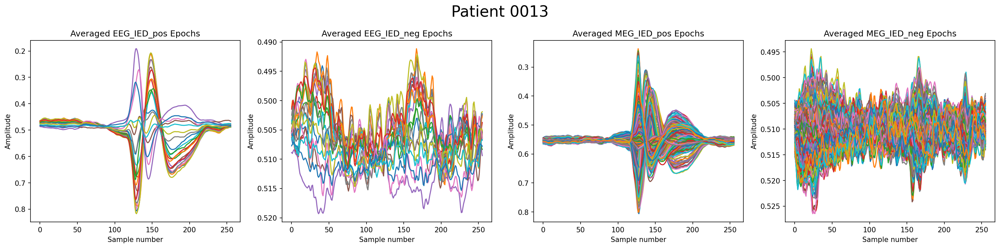

In [9]:
fig_0013, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0013, axis=0))
ax1.invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0013, axis=0))
ax2.invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0013, axis=0))
ax3.invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0013, axis=0))
ax4.invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig_0013.suptitle('Patient 0013', fontsize=22) ##### TO BE CHANGED
fig_0013.tight_layout()

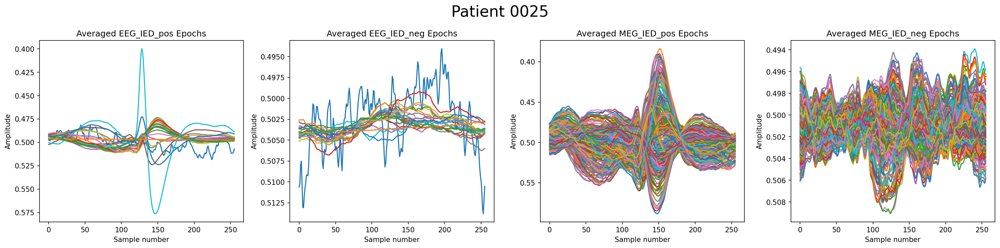

In [10]:
fig_0025, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0025, axis=0))
ax1.invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0025, axis=0))
ax2.invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0025, axis=0))
ax3.invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0025, axis=0))
ax4.invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig_0025.suptitle('Patient 0025', fontsize=22) ##### TO BE CHANGED
fig_0025.tight_layout()

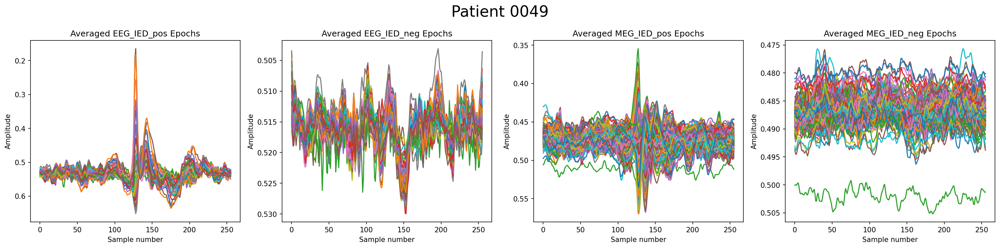

In [11]:
fig_0049, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0049, axis=0))
# ax1.plot(np.mean(POS_EEG_0049[:,:,2], axis=0))
ax1.invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0049, axis=0))
ax2.invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0049, axis=0))
ax3.invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0049, axis=0))
ax4.invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig_0049.suptitle('Patient 0049', fontsize=22) ##### TO BE CHANGED
fig_0049.tight_layout()

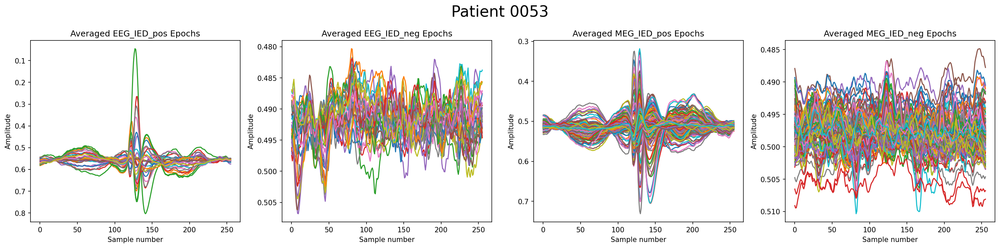

In [12]:
fig_0053, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0053, axis=0))
# ax1.plot(np.mean(POS_EEG_0053[:,:,2], axis=0))
ax1.invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0053, axis=0))
ax2.invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0053, axis=0))
ax3.invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0053, axis=0))
ax4.invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig_0053.suptitle('Patient 0053', fontsize=22) ##### TO BE CHANGED
fig_0053.tight_layout()

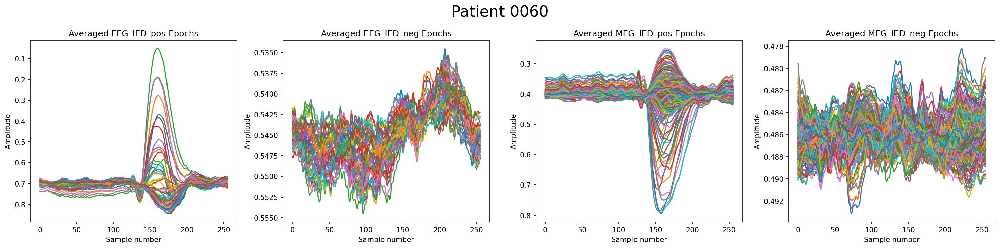

In [13]:
fig_0060, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0060, axis=0))
ax1.invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0060, axis=0))
ax2.invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0060, axis=0))
ax3.invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0060, axis=0))
ax4.invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig_0060.suptitle('Patient 0060', fontsize=22) ##### TO BE CHANGED
fig_0060.tight_layout()

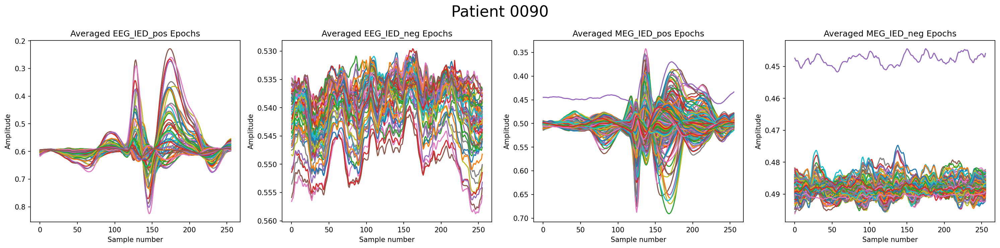

In [14]:
fig_0090, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0090, axis=0))
ax1.invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0090, axis=0))
ax2.invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0090, axis=0))
ax3.invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0090, axis=0))
ax4.invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig_0090.suptitle('Patient 0090', fontsize=22) ##### TO BE CHANGED
fig_0090.tight_layout()

In [ ]:
fig_0013.savefig('pt0013_avg_subplots.png')
fig_0025.savefig('pt0025_avg_subplots.png')
fig_0049.savefig('pt0049_avg_subplots.png')
fig_0053.savefig('pt0053_avg_subplots.png')
fig_0060.savefig('pt0060_avg_subplots.png')
fig_0090.savefig('pt0090_avg_subplots.png')

Ignore below because I didnt invert the plot

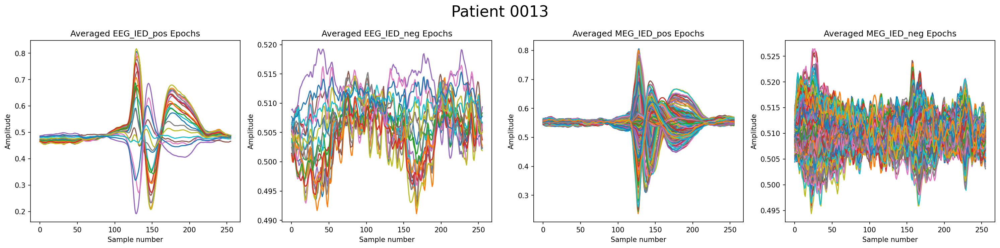

In [10]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0013, axis=0))
plt.gca().invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0013, axis=0))
plt.gca().invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0013, axis=0))
plt.gca().invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0013, axis=0))
plt.gca().invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig.suptitle('Patient 0013', fontsize=22)
fig.tight_layout()
fig.savefig('pt0013_avg_subplots.png')

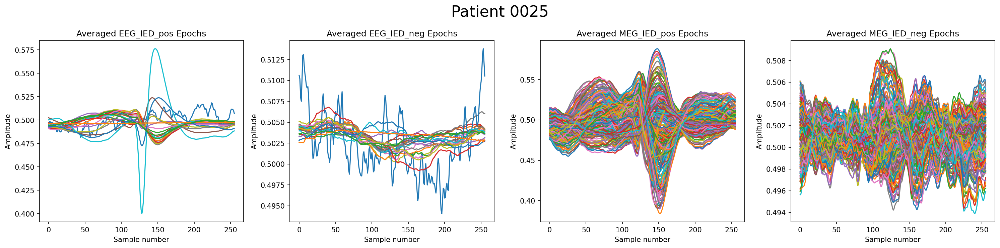

In [11]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0025, axis=0))
plt.gca().invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0025, axis=0))
plt.gca().invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0025, axis=0))
plt.gca().invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0025, axis=0))
plt.gca().invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig.suptitle('Patient 0025', fontsize=22)
fig.tight_layout()
fig.savefig('pt0025_avg_subplots.png')

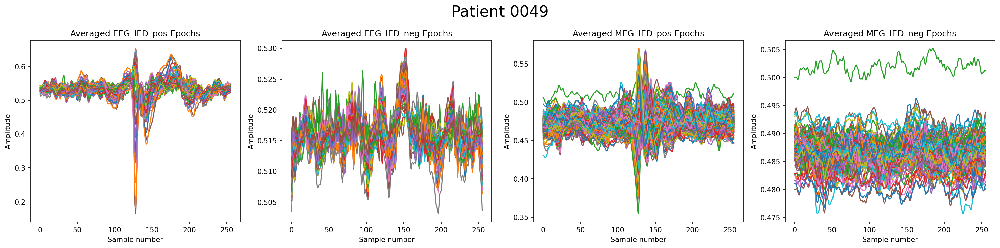

In [12]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0049, axis=0))
plt.gca().invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0049, axis=0))
plt.gca().invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0049, axis=0))
plt.gca().invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0049, axis=0))
plt.gca().invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig.suptitle('Patient 0049', fontsize=22)
fig.tight_layout()
fig.savefig('pt0049_avg_subplots.png')

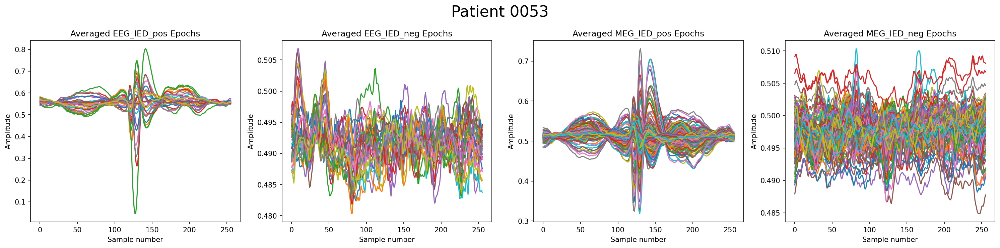

In [13]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0053, axis=0))
plt.gca().invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0053, axis=0))
plt.gca().invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0053, axis=0))
plt.gca().invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0053, axis=0))
plt.gca().invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig.suptitle('Patient 0053', fontsize=22)
fig.tight_layout()
fig.savefig('pt0053_avg_subplots.png')

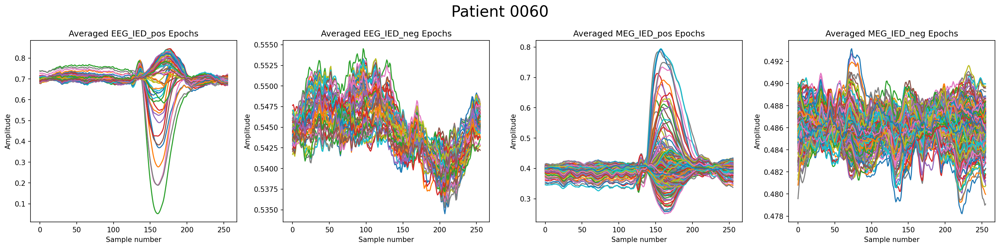

In [14]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0060, axis=0))
plt.gca().invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0060, axis=0))
plt.gca().invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0060, axis=0))
plt.gca().invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0060, axis=0))
plt.gca().invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig.suptitle('Patient 0060', fontsize=22)
fig.tight_layout()
fig.savefig('pt0060_avg_subplots.png')

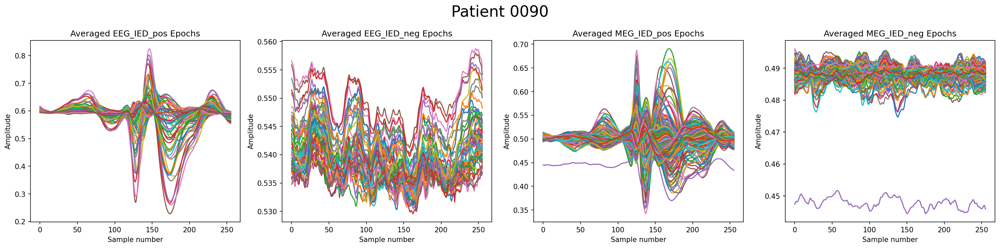

In [15]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5), dpi=150)

ax1.plot(np.mean(POS_EEG_0090, axis=0))
plt.gca().invert_yaxis()
ax1.set_title('Averaged EEG_IED_pos Epochs')
ax1.set_xlabel('Sample number')
ax1.set_ylabel('Amplitude')

ax2.plot(np.mean(NEG_EEG_0090, axis=0))
plt.gca().invert_yaxis()
ax2.set_title('Averaged EEG_IED_neg Epochs')
ax2.set_xlabel('Sample number')
ax2.set_ylabel('Amplitude')

ax3.plot(np.mean(POS_MEG_0090, axis=0))
plt.gca().invert_yaxis()
ax3.set_title('Averaged MEG_IED_pos Epochs')
ax3.set_xlabel('Sample number')
ax3.set_ylabel('Amplitude')

ax4.plot(np.mean(NEG_MEG_0090, axis=0))
plt.gca().invert_yaxis()
ax4.set_title('Averaged MEG_IED_neg Epochs')
ax4.set_xlabel('Sample number')
ax4.set_ylabel('Amplitude')

fig.suptitle('Patient 0090', fontsize=22)
fig.tight_layout()
fig.savefig('pt0090_avg_subplots.png')

## [pre 4 and 5] Sampling

In [ ]:
# Balance dataset

n = POS_EEG_0025.shape[0] # get number of pos epoch

random_index = np.random.randint(0, len(NEG_EEG_0025) - n) # downsample neg epoch
NEG_EEG_0025 = NEG_EEG_0025[random_index:random_index + n, :, :]
print(NEG_EEG_0025.shape)

random_index = np.random.randint(0, len(NEG_MEG_0025) - n) # downsample neg epoch
NEG_MEG_0025 = NEG_MEG_0025[random_index:random_index + n, :, :]
print(NEG_MEG_0025.shape)

### EEG Pickles

In [61]:
# POS_EEG = POS_EEG_0013 ########################################
# NEG_EEG = NEG_EEG_0013 ########################################

print('===== Checking concatenated EEG data =====')
EEG_all_X = np.concatenate((POS_EEG, NEG_EEG))
print(EEG_all_X.shape)
EEG_y_1s = np.ones(POS_EEG.shape[0]).astype(int)
EEG_y_0s = np.zeros(NEG_EEG.shape[0]).astype(int)
EEG_all_y = np.concatenate((EEG_y_1s, EEG_y_0s))
print(EEG_all_y.shape)

print('===== Checking Trainin / Testing / Validation data =====')
# Create Training, Validation, and Test Sets from all of our available data
# Use 70/15/15 split since dataset is relatively small
EEG_X_train,EEG_X_val_test,EEG_y_train,EEG_y_val_test = train_test_split(EEG_all_X,EEG_all_y, test_size=0.3)
EEG_X_val,EEG_X_test,EEG_y_val,EEG_y_test = train_test_split(EEG_X_val_test,EEG_y_val_test, test_size=0.5)
print(EEG_X_train.shape)
print(EEG_y_train.shape)
print(EEG_X_val.shape)
print(EEG_y_val.shape)
print(EEG_X_test.shape)
print(EEG_y_test.shape)
# Print a few y's to make sure that the data is indeed shuffled:
print(EEG_y_test[0:10])
print(EEG_y_val[0:10])
print(EEG_y_train[0:10])

===== Checking concatenated EEG data =====
(3501, 256, 56)
(3501,)
===== Checking Trainin / Testing / Validation data =====
(2450, 256, 56)
(2450,)
(525, 256, 56)
(525,)
(526, 256, 56)
(526,)
[0 1 1 1 0 1 1 1 0 0]
[0 1 1 0 1 0 0 1 0 1]
[1 0 1 0 0 0 1 1 0 0]


In [92]:
# Dump train test validation pickle
pickle.dump(EEG_X_train, open(path+"EEG_X_train.pickle",'wb'))
pickle.dump(EEG_X_val, open(path+"EEG_X_val.pickle",'wb'))
pickle.dump(EEG_X_test, open(path+"EEG_X_test.pickle",'wb'))
pickle.dump(EEG_y_train, open(path+"EEG_y_train.pickle",'wb'))
pickle.dump(EEG_y_val, open(path+"EEG_y_val.pickle",'wb'))
pickle.dump(EEG_y_test, open(path+"EEG_y_test.pickle",'wb'))

### MEG Pickles

In [62]:
# POS_MEG = POS_MEG_0013 ########################################
# NEG_MEG = NEG_MEG_0013 ########################################

print('===== Checking concatenated MEG data (from train) =====')
MEG_all_X = np.concatenate((POS_MEG, NEG_MEG))
print(MEG_all_X.shape)
MEG_y_1s = np.ones(POS_MEG.shape[0]).astype(int)
MEG_y_0s = np.zeros(NEG_MEG.shape[0]).astype(int)
MEG_all_y = np.concatenate((MEG_y_1s, MEG_y_0s))
print(MEG_all_y.shape)

print('===== Checking Trainin / Testing / Validation data =====')
# # Create Training, Validation, and Test Sets from all of our available data
# # Use 70/15/15 split since dataset is relatively smal
MEG_X_train,MEG_X_val_test,MEG_y_train,MEG_y_val_test = train_test_split(MEG_all_X,MEG_all_y, test_size=0.3) # 30% being test and val datasets
MEG_X_val,MEG_X_test,MEG_y_val,MEG_y_test = train_test_split(MEG_X_val_test,MEG_y_val_test, test_size=0.5) # separate test and val half half

print(MEG_X_train.shape)
print(MEG_y_train.shape)
print(MEG_X_val.shape)
print(MEG_y_val.shape)
print(MEG_X_test.shape)
print(MEG_y_test.shape)
# Print a few y's to make sure that the data is indeed shuffled:
print(MEG_y_test[0:10])
print(MEG_y_val[0:10])
print(MEG_y_train[0:10])

===== Checking concatenated MEG data (from train) =====
(3501, 256, 274)
(3501,)
===== Checking Trainin / Testing / Validation data =====
(2450, 256, 274)
(2450,)
(525, 256, 274)
(525,)
(526, 256, 274)
(526,)
[0 1 1 0 1 0 0 1 1 1]
[1 0 0 1 1 1 0 0 1 1]
[0 1 0 0 1 1 1 0 0 1]


In [12]:
# Dump train test validation pickle
pickle.dump(MEG_X_train, open(path+"MEG_X_train.pickle",'wb'))
pickle.dump(MEG_X_val, open(path+"MEG_X_val.pickle",'wb'))
pickle.dump(MEG_X_test, open(path+"MEG_X_test.pickle",'wb'))
pickle.dump(MEG_y_train, open(path+"MEG_y_train.pickle",'wb'))
pickle.dump(MEG_y_val, open(path+"MEG_y_val.pickle",'wb'))
pickle.dump(MEG_y_test, open(path+"MEG_y_test.pickle",'wb'))

## [4] Hyperparameter Grid Search with Cross Validation

## [5] Training and Testing Model Using Optimal Hyperparameters

In [11]:
n_EEG = 21
n_MEG = 272

### EEG IED DETECTOR MODEL

In [ ]:
EEG_X_train = pickle.load(open(path+"EEG_X_train.pickle",'rb'))
EEG_X_val = pickle.load(open(path+"EEG_X_val.pickle",'rb'))
EEG_X_test = pickle.load(open(path+"EEG_X_test.pickle",'rb'))
EEG_y_train = pickle.load(open(path+"EEG_y_train.pickle",'rb'))
EEG_y_val = pickle.load(open(path+"EEG_y_val.pickle",'rb'))
EEG_y_test = pickle.load(open(path+"EEG_y_test.pickle",'rb'))

In [12]:
EEG_X_train.shape

(1710, 256, 21)

In [63]:
model = tf.keras.Sequential()

DROPOUT = 0.2
FILTERS = 32
FULLUNEURONS = 50

model.add(layers.Conv2D(FILTERS, (3, 3), padding="same", input_shape=(256, eegChannelNum, 1)))
model.add(layers.BatchNormalization())
model.add(layers.Activation("relu"))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Dropout(DROPOUT))

model.add(layers.Conv2D(FILTERS*2, (3, 3), padding="same"))
model.add(layers.BatchNormalization())
model.add(layers.Activation("relu"))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Dropout(DROPOUT))

model.add(layers.Conv2D(FILTERS*3, (3, 3), padding="same"))
model.add(layers.BatchNormalization())
model.add(layers.Activation("relu"))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Dropout(DROPOUT))

model.add(layers.Flatten())

model.add(layers.Dense(FULLUNEURONS)) 
model.add(layers.BatchNormalization())
model.add(layers.Activation("relu"))
model.add(layers.Dropout(DROPOUT))

model.add(layers.Dense(1, activation="sigmoid"))

optimizer = Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, epsilon=1e-08) 
model.compile(optimizer=optimizer, loss=tf.keras.losses.BinaryCrossentropy(), metrics=["accuracy", tf.keras.metrics.AUC(curve="ROC", from_logits=True), tf.keras.metrics.AUC(curve="PR", from_logits=True), tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]) 
#Loss set to binary_crossentropy using Boston paper #Note to self: labels need to be in one-hot representation

keras.backend.clear_session()

##########################################################################################################################################################################

epochs = 20

checkpoint = ModelCheckpoint("model_weights.h5", monitor="val_accuracy", 
                            save_weights_only=True, mode="max", verbose=1)

reduce_lr = ReduceLROnPlateau(monitor="loss", factor=0.1, patience=2, min_lr=0.00001, model="auto") #learning rate scheduling, decreases learning rate by 0.1 if doesn't get better for 2 epochs

callbacks = [checkpoint, reduce_lr]

history = model.fit(
    x = EEG_X_train,
    y = EEG_y_train,
    validation_data = (EEG_X_val, EEG_y_val),
    epochs=epochs,
    callbacks = callbacks
    )

Epoch 1/20
77/77 [==============================] - ETA: 0s - loss: 0.3066 - accuracy: 0.8804 - auc: 0.9441 - auc_1: 0.9410 - precision: 0.8891 - recall: 0.8615
Epoch 1: saving model to model_weights.h5
77/77 [==============================] - 4s 29ms/step - loss: 0.3066 - accuracy: 0.8804 - auc: 0.9441 - auc_1: 0.9410 - precision: 0.8891 - recall: 0.8615 - val_loss: 0.6147 - val_accuracy: 0.6724 - val_auc: 0.9346 - val_auc_1: 0.9408 - val_precision: 0.6199 - val_recall: 0.9856 - lr: 0.0100
Epoch 2/20
76/77 [============================>.] - ETA: 0s - loss: 0.1775 - accuracy: 0.9359 - auc: 0.9792 - auc_1: 0.9793 - precision: 0.9446 - recall: 0.9223
Epoch 2: saving model to model_weights.h5
77/77 [==============================] - 2s 20ms/step - loss: 0.1776 - accuracy: 0.9355 - auc: 0.9792 - auc_1: 0.9793 - precision: 0.9449 - recall: 0.9211 - val_loss: 0.4161 - val_accuracy: 0.8038 - val_auc: 0.9890 - val_auc_1: 0.9914 - val_precision: 1.0000 - val_recall: 0.6295 - lr: 0.0100
Epoch 3/

In [64]:
results = model.evaluate(EEG_X_test, EEG_y_test)


17/17 [==============================] - 0s 7ms/step - loss: 0.0745 - accuracy: 0.9810 - auc: 0.9960 - auc_1: 0.9941 - precision: 0.9847 - recall: 0.9773


In [ ]:
# Confusion Matrix

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Make predictions on the test data
y_pred = model.predict(EEG_X_test)
y_pred = np.round(y_pred).flatten()

# Calculate the confusion matrix
cm = confusion_matrix(EEG_y_test, y_pred)

# Plot the confusion matrix
fig, ax = plt.subplots()
im = ax.imshow(cm, cmap='Blues')

# Add labels and colorbar
ax.set_xticks(np.arange(2))
ax.set_yticks(np.arange(2))
ax.set_xticklabels(['Non-IED', 'IED'])
ax.set_yticklabels(['Non-IED', 'IED'])
plt.colorbar(im)

# Add annotations to the plot
thresh = cm.max() / 2
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], 'd'),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")

plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.show()

In [128]:
fig.savefig('pt0060_EEG_confusion-matrix.png')

### MEG IED DETECTOR MODEL

In [ ]:
MEG_X_train = pickle.load(open(path+"MEG_X_train.pickle",'rb'))
MEG_X_val = pickle.load(open(path+"MEG_X_val.pickle",'rb'))
MEG_X_test = pickle.load(open(path+"MEG_X_test.pickle",'rb'))
MEG_y_train = pickle.load(open(path+"MEG_y_train.pickle",'rb'))
MEG_y_val = pickle.load(open(path+"MEG_y_val.pickle",'rb'))
MEG_y_test = pickle.load(open(path+"MEG_y_test.pickle",'rb'))

In [ ]:
MEG_X_train.shape

(1124, 256, 270)

In [66]:
model = tf.keras.Sequential()

DROPOUT = 0.2
FILTERS = 32
FULLUNEURONS = 100

model.add(layers.Conv2D(FILTERS, (3, 3), padding="same", input_shape=(256, megChannelNum, 1)))
model.add(layers.BatchNormalization())
model.add(layers.Activation("relu"))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Dropout(DROPOUT))

model.add(layers.Conv2D(FILTERS*2, (3, 3), padding="same"))
model.add(layers.BatchNormalization())
model.add(layers.Activation("relu"))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Dropout(DROPOUT))

model.add(layers.Conv2D(FILTERS*3, (3, 3), padding="same"))
model.add(layers.BatchNormalization())
model.add(layers.Activation("relu"))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Dropout(DROPOUT))

model.add(layers.Flatten())

model.add(layers.Dense(FULLUNEURONS))
model.add(layers.BatchNormalization())
model.add(layers.Activation("relu"))
model.add(layers.Dropout(DROPOUT))

model.add(layers.Dense(1, activation="sigmoid"))

optimizer = Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, epsilon=1e-08) 
model.compile(optimizer=optimizer, loss=tf.keras.losses.BinaryCrossentropy(), metrics=["accuracy", tf.keras.metrics.AUC(curve="ROC", from_logits=True), tf.keras.metrics.AUC(curve="PR", from_logits=True), tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]) #Loss set to binary_crossentropy using Boston paper #Note to self: labels need to be in one-hot representation

keras.backend.clear_session()

#############################################################################################################################################################################################

epochs = 20

checkpoint = ModelCheckpoint("model_weights.h5", monitor="val_accuracy", 
                            save_weights_only=True, mode="max", verbose=1)

reduce_lr = ReduceLROnPlateau(monitor="loss", factor=0.1, patience=2, min_lr=0.00001, model="auto") #learning rate scheduling, decreases learning rate by 0.1 if doesn't get better for 2 epochs

callbacks = [checkpoint, reduce_lr]

history = model.fit(
    x = MEG_X_train,
    y = MEG_y_train,
    validation_data = (MEG_X_val, MEG_y_val),
    epochs=epochs,
    callbacks = callbacks
    )


Epoch 1/20
77/77 [==============================] - ETA: 0s - loss: 0.4187 - accuracy: 0.8200 - auc: 0.8921 - auc_1: 0.9016 - precision: 0.8362 - recall: 0.7929
Epoch 1: saving model to model_weights.h5
77/77 [==============================] - 9s 79ms/step - loss: 0.4187 - accuracy: 0.8200 - auc: 0.8921 - auc_1: 0.9016 - precision: 0.8362 - recall: 0.7929 - val_loss: 0.6817 - val_accuracy: 0.5105 - val_auc: 0.9210 - val_auc_1: 0.9314 - val_precision: 1.0000 - val_recall: 0.0153 - lr: 0.0100
Epoch 2/20
76/77 [============================>.] - ETA: 0s - loss: 0.1959 - accuracy: 0.9231 - auc: 0.9743 - auc_1: 0.9792 - precision: 0.9466 - recall: 0.8957
Epoch 2: saving model to model_weights.h5
77/77 [==============================] - 5s 64ms/step - loss: 0.1951 - accuracy: 0.9233 - auc: 0.9745 - auc_1: 0.9794 - precision: 0.9470 - recall: 0.8956 - val_loss: 0.5872 - val_accuracy: 0.6419 - val_auc: 0.9780 - val_auc_1: 0.9823 - val_precision: 1.0000 - val_recall: 0.2797 - lr: 0.0100
Epoch 3/

In [67]:
results = model.evaluate(MEG_X_test, MEG_y_test)

17/17 [==============================] - 0s 22ms/step - loss: 0.1151 - accuracy: 0.9658 - auc: 0.9873 - auc_1: 0.9884 - precision: 0.9759 - recall: 0.9529


In [ ]:
# Confusion Matrix

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Make predictions on the test data
y_pred = model.predict(MEG_X_test)
y_pred = np.round(y_pred).flatten()

# Calculate the confusion matrix
cm = confusion_matrix(MEG_y_test, y_pred)

# Plot the confusion matrix
fig, ax = plt.subplots()
im = ax.imshow(cm, cmap='Blues')

# Add labels and colorbar
ax.set_xticks(np.arange(2))
ax.set_yticks(np.arange(2))
ax.set_xticklabels(['Non-IED', 'IED'])
ax.set_yticklabels(['Non-IED', 'IED'])
plt.colorbar(im)

# Add annotations to the plot
thresh = cm.max() / 2
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], 'd'),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")

plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.show()

In [132]:
fig.savefig('pt0060_MEG_confusion-matrix.png')

## [6] Visualize the Model's Classification

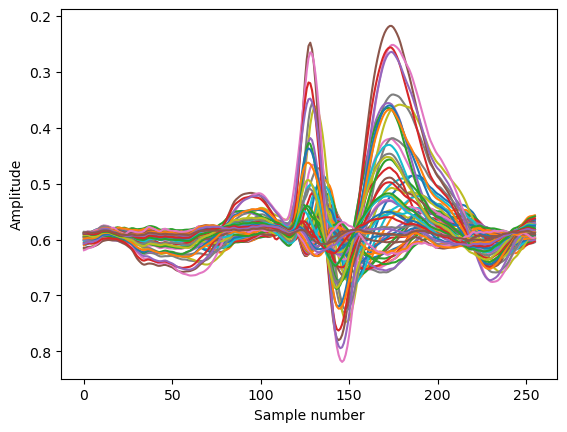

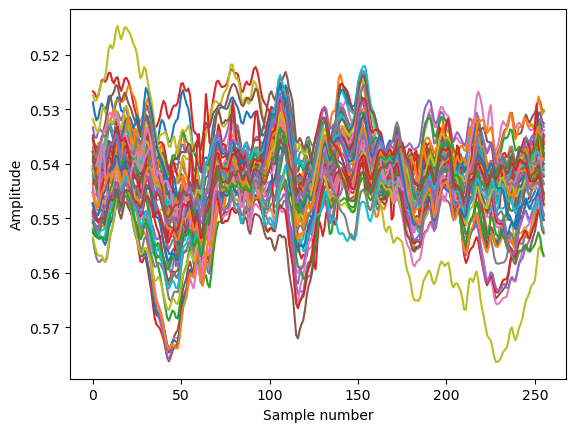

In [65]:
# Need for NSCI 420

# EEG

prediction_test = model.predict(EEG_X_test)
prediction_test = (prediction_test > 0.5).astype(np.float32)
prediction_test = prediction_test.flatten()

positive_indices = []
negative_indices = []

for i in range(0, len(prediction_test)):
  if prediction_test[i] == 1:
    positive_indices.append(i)
  else:
    negative_indices.append(i)

predicted_test_positives = np.mean(EEG_X_test[positive_indices, :, :], axis=0)
show_time_series(predicted_test_positives, "Sample number", "Amplitude")

predicted_test_negatives = np.mean(EEG_X_test[negative_indices, :, :], axis=0)
show_time_series(predicted_test_negatives, "Sample number", "Amplitude")

# pt0090_predicted_EEG-IEDpos_avg
# pt0090_predicted_EEG-IEDneg_avg

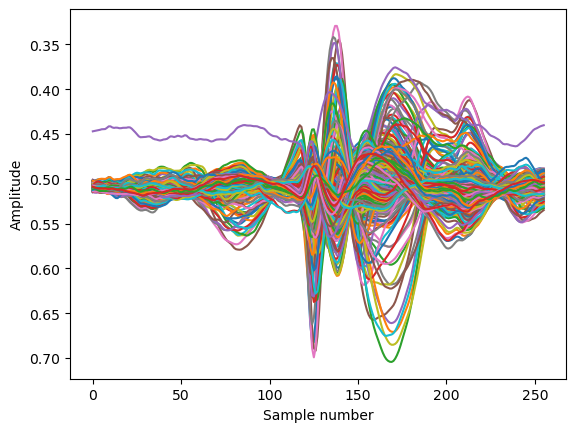

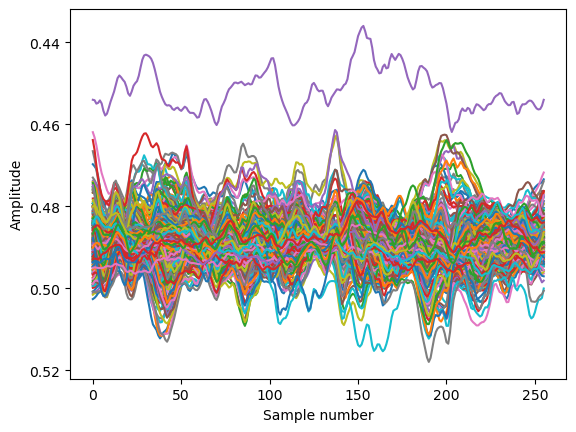

In [68]:
# MEG

prediction_test = model.predict(MEG_X_test)
prediction_test = (prediction_test > 0.5).astype(np.float32)
prediction_test = prediction_test.flatten()

positive_indices = []
negative_indices = []

for i in range(0, len(prediction_test)):
  if prediction_test[i] == 1:
    positive_indices.append(i)
  else:
    negative_indices.append(i)

predicted_test_positives = np.mean(MEG_X_test[positive_indices, :, :], axis=0)
show_time_series(predicted_test_positives, "Sample number", "Amplitude")
     
predicted_test_negatives = np.mean(MEG_X_test[negative_indices, :, :], axis=0)
show_time_series(predicted_test_negatives, "Sample number", "Amplitude")

# pt0090_predicted_MEG-IEDpos_avg
# pt0090_predicted_MEG-IEDneg_avg

### EEG

In [18]:
prediction_test = model.predict(EEG_X_test)
prediction_test = (prediction_test > 0.5).astype(np.float32)
prediction_test = prediction_test.flatten()

positive_indices = []
negative_indices = []

for i in range(0, len(prediction_test)):
  if prediction_test[i] == 1:
    positive_indices.append(i)
  else:
    negative_indices.append(i)

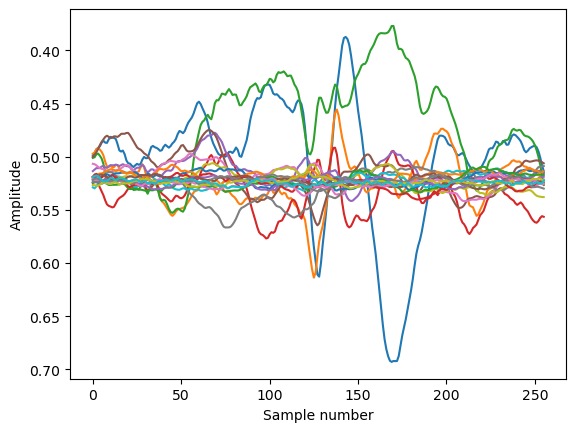

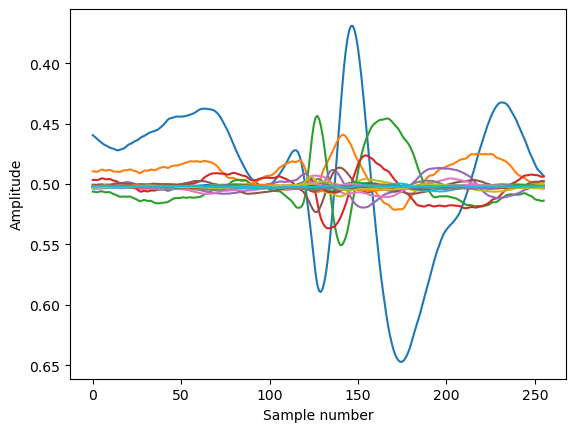

In [19]:
def show_time_series(data, xlable, ylabel):
  cur = data 
  plt.plot(cur)
  plt.gca().invert_yaxis() #Invert to match the default reversed y-axis view in Brainstorm.
  plt.xlabel(xlable)
  plt.ylabel(ylabel)
  plt.show()

predicted_test_positives = np.mean(EEG_X_test[positive_indices, :, :], axis=0)
show_time_series(predicted_test_positives, "Sample number", "Amplitude")
     
predicted_test_negatives = np.mean(EEG_X_test[negative_indices, :, :], axis=0)
show_time_series(predicted_test_negatives, "Sample number", "Amplitude")

In [16]:
#Stress testing the model on only the positive data in the test dataset

ied_only_indices = []

for i in range(0, len(EEG_y_test)):
  if EEG_y_test[i] == 1:
    ied_only_indices.append(i)
     
IED_only_prediction = model.predict(EEG_X_test[ied_only_indices,:,:])
IED_only_prediction = (IED_only_prediction > 0.5).astype(np.float32)
IED_only_prediction = IED_only_prediction.flatten()

collections.Counter(IED_only_prediction)

Counter({0.0: 1715, 1.0: 18})

In [17]:
#Stress testing the model on only the negative data in the test dataset

neg_only_indices = []

for i in range(0, len(EEG_y_test)):
  if EEG_y_test[i] == 0:
    neg_only_indices.append(i)
     
neg_only_prediction = model.predict(EEG_X_test[neg_only_indices,:,:])
neg_only_prediction = (neg_only_prediction > 0.5).astype(np.float32)
neg_only_prediction = neg_only_prediction.flatten()
     
collections.Counter(neg_only_prediction)

Counter({0.0: 1746, 1.0: 22})

### MEG 

In [9]:
prediction_test = model.predict(MEG_X_test)
prediction_test = (prediction_test > 0.5).astype(np.float32)
prediction_test = prediction_test.flatten()

In [10]:
positive_indices = []
negative_indices = []

for i in range(0, len(prediction_test)):
  if prediction_test[i] == 1:
    positive_indices.append(i)
  else:
    negative_indices.append(i)

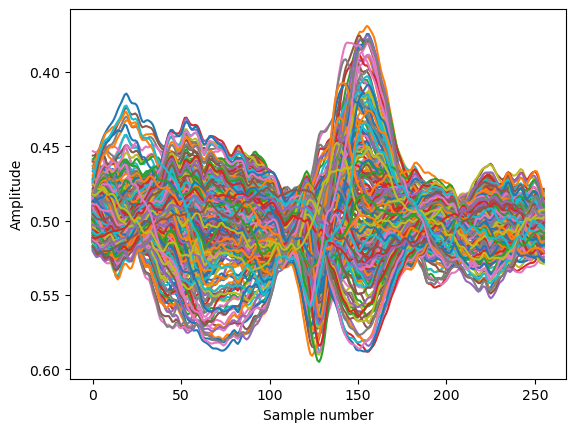

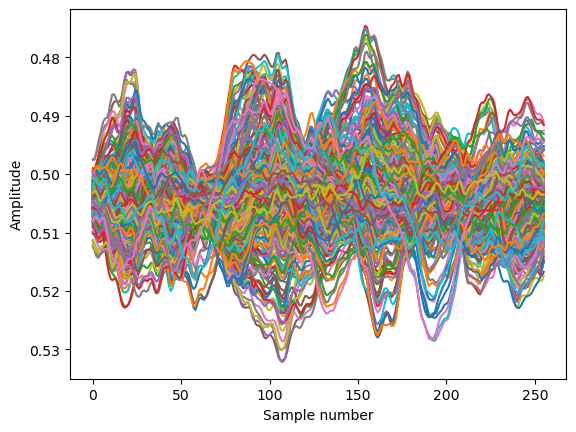

In [11]:
def show_time_series(data, xlable, ylabel):
  cur = data 
  plt.plot(cur)
  plt.gca().invert_yaxis() #Invert to match the default reversed y-axis view in Brainstorm.
  plt.xlabel(xlable)
  plt.ylabel(ylabel)
  plt.show()

predicted_test_positives = np.mean(MEG_X_test[positive_indices, :, :], axis=0)
show_time_series(predicted_test_positives, "Sample number", "Amplitude")
     

predicted_test_negatives = np.mean(MEG_X_test[negative_indices, :, :], axis=0)
show_time_series(predicted_test_negatives, "Sample number", "Amplitude")

In [12]:
#Stress testing the model on only the positive data in the test dataset

ied_only_indices = []

for i in range(0, len(MEG_y_test)):
  if MEG_y_test[i] == 1:
    ied_only_indices.append(i)
     

IED_only_prediction = model.predict(MEG_X_test[ied_only_indices,:,:])
IED_only_prediction = (IED_only_prediction > 0.5).astype(np.float32)
IED_only_prediction = IED_only_prediction.flatten()
     

collections.Counter(IED_only_prediction)

Counter({1.0: 56, 0.0: 27})

In [13]:
#Stress testing the model on only the negative data in the test dataset

neg_only_indices = []

for i in range(0, len(MEG_y_test)):
  if MEG_y_test[i] == 0:
    neg_only_indices.append(i)
     

neg_only_prediction = model.predict(MEG_X_test[neg_only_indices,:,:])
neg_only_prediction = (neg_only_prediction > 0.5).astype(np.float32)
neg_only_prediction = neg_only_prediction.flatten()
     

collections.Counter(neg_only_prediction)

Counter({0.0: 311, 1.0: 16})